In [54]:
import pandas as pd
from sklearn.preprocessing import LabelEncoder
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

import plotly.tools as tls
import plotly.offline as py
from plotly.offline import init_notebook_mode, iplot, plot
import plotly.graph_objs as go
init_notebook_mode(connected=True)
import warnings
from collections import Counter
df=pd.read_csv("mle-test-master/kickstarter-dataset-1.csv",engine='python')

In [55]:
df2=pd.read_csv("mle-test-master/kickstarter-dataset-2.csv",engine='python',parse_dates=['deadline', 'launched'])

In [56]:
print('Unique values ', list(df2.state.unique()))


Unique values  ['failed', 'canceled', 'successful', 'live', 'undefined', 'suspended']


In [75]:
#visualizations
success_perc = round(df2["state"].value_counts() / len(df2["state"]) * 100,2)

print("State perc in %: ")
print(success_perc)

states = round(df2["state"].value_counts() / len(df2["state"]) * 100,2)

labels = list(states.index)
values = list(states.values)

graph1 = go.Pie(labels=labels, values=values, marker=dict(colors=['red']))

graph2 = go.Layout(title='Distribuition of States', legend=dict(orientation="h"));

fig = go.Figure(data=[graph1], layout=graph2)
iplot(fig)

State perc in %: 
failed        52.60
successful    35.64
canceled      10.32
undefined      0.95
suspended      0.49
Name: state, dtype: float64


In [106]:
import numpy as np
fail = df2[df2["state"] == "failed"]
success = df2[df2["state"] == "successful"]

#First plot
graph1 = go.Histogram(
    x= np.log(df2.usd_goal_real + 1).head(100000),
    histnorm='probability', showlegend=False,
    xbins=dict(
        start=-5.0,
        end=19.0,
        size=1),
    autobiny=True)

#Second plot
graph2 = go.Histogram(
    x = np.log(df2.usd_pledged_real + 1).head(100000),
    histnorm='probability', showlegend=False,
    xbins=dict(
        start=-1.0,
        end=17.0,
        size=1))

# Add histogram data
x1 = np.log(fail['usd_goal_real']+1).head(100000)
x2 = np.log(success["usd_goal_real"]+1).head(100000)

graph3 = go.Histogram(
    x=x1,
    opacity=0.60, nbinsx=30, name='Goals Failed', histnorm='probability'
)
graph4 = go.Histogram(
    x=x2,
    opacity=0.60, nbinsx=30, name='Goals Sucessful', histnorm='probability'
)


data = [graph1, graph2, graph3, graph4]
layout = go.Layout(barmode='overlay')

#Creating the grid
fig = tls.make_subplots(rows=2, cols=2, specs=[ [{'colspan': 2}, None], [{}, {}]],
                          subplot_titles=('Failed and Sucessful Projects',
                                          'Goal','Pledged'))

#setting the figs
fig.append_trace(graph1, 2, 1)
fig.append_trace(graph2, 2, 2)
fig.append_trace(trace3, 1, 1)
fig.append_trace(trace4, 1, 1)

fig['layout'].update(title="Distribuitions",
                     height=500, width=900, barmode='overlay')
iplot(fig)


/Users/JThomas/opt/miniconda3/envs/test-env/lib/python3.6/site-packages/plotly/tools.py:465: DeprecationWarning:

plotly.tools.make_subplots is deprecated, please use plotly.subplots.make_subplots instead



In [107]:
cats = df2["main_category"].value_counts()
cats_failed = df2[df2["state"] == "failed"]["main_category"].value_counts()
cats_success = df2[df2["state"] == "successful"]["main_category"].value_counts()

In [108]:
graph1 = go.Bar(
    x=cats_failed.index,
    y=cats_failed.values,
    name="Failed cats"
)
#Second plot
graph2 = go.Bar(
    x=cats_success.index,
    y=cats_success.values,
    name="Success cats"
)
#Third plot
graph3 = go.Bar(
    x=cats.index,
    y=cats.values,
    name="all cats"
)

#Creating the grid
fig = tls.make_subplots(rows=2, cols=2, specs=[[{}, {}], [{'colspan': 2}, None]],
                          subplot_titles=('Failed','Sucessful', "general"))

#setting the figs
fig.append_trace(graph1, 1, 1)
fig.append_trace(graph2, 1, 2)
fig.append_trace(graph3, 2, 1)
fig['layout'].update(showlegend=True, title="Main Categories",bargap=0.05)
iplot(fig)


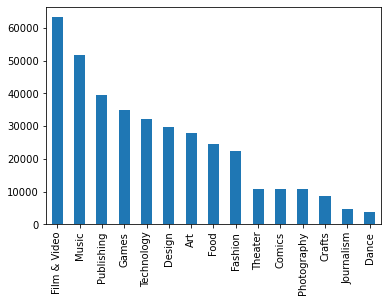

In [86]:
df2['main_category'].value_counts().plot.bar()
plt.show()

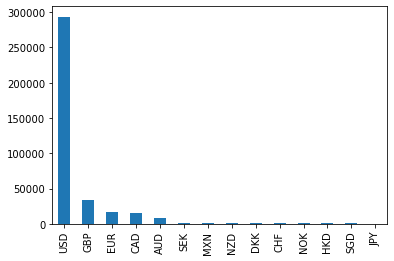

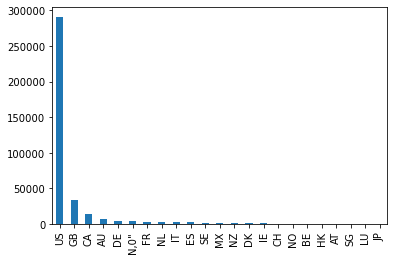

In [87]:
df2['currency'].value_counts().plot.bar()
plt.show()

df2['country'].value_counts().plot.bar()
plt.show()


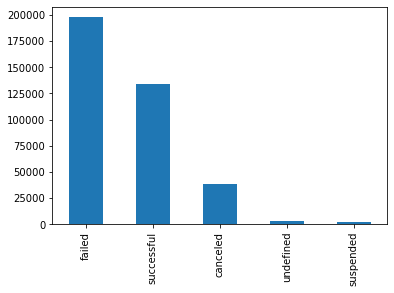

In [88]:
df2['state'].value_counts().plot.bar()
plt.show()


In [57]:
df2 = df2.query('state != "live"')

df2 = df2.assign(outcome=(df2['state'] == 'successful').astype(int))

In [59]:
df2 = df2.assign(hour=df2.launched.dt.hour,
               day=df2.launched.dt.day,
               month=df2.launched.dt.month,
               year=df2.launched.dt.year)


In [61]:

cat_features = ['category', 'currency', 'country']
encoder = LabelEncoder()

# Apply the label encoder to each column
encoded = df2[cat_features].apply(encoder.fit_transform)

In [63]:
dates = df2[['goal', 'hour', 'day', 'month', 'year', 'outcome']].join(encoded)


In [64]:
vperc=0.1
vsize = int(len(dates) * vperc)

train = dates[:-2 * vsize]
valid = dates[-2 * vsize:-vsize]
test = dates[-vsize:]

In [65]:
#model xgboost
import lightgbm as lgb

features = train.columns.drop('outcome')

train_data = lgb.Dataset(train[features], label=train['outcome'])
valid_data= lgb.Dataset(valid[features], label=valid['outcome'])

params = {'num_leaves': 128, 'objective': 'binary'}
params['metric'] = 'auc'
rounds = 2000
model = lgb.train(params, train_data, rounds, valid_sets=[valid_data], early_stopping_rounds=20, verbose_eval=False)

In [66]:
from sklearn import metrics
y_pred = model.predict(test[features])
score = metrics.roc_auc_score(test['outcome'], y_pred)

print(f"Test AUC score: {score}")

Test AUC score: 0.7475356854576578
